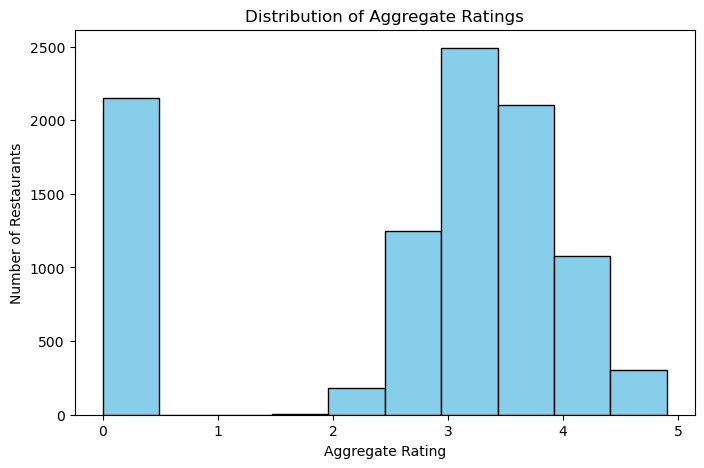

The most common aggregate rating is: 0.0
The average number of votes received by restaurants is: 156.91


In [2]:
#LEVEL-2
import matplotlib.pyplot as plt
import pandas as pd
df=pd.read_csv('Dataset .csv')

# Step 1: Create a histogram of the 'Aggregate rating' column
plt.figure(figsize=(8, 5))
plt.hist(df['Aggregate rating'], bins=10, edgecolor='black', color='skyblue')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Restaurants')
plt.show()

# Step 2: Find the most common aggregate rating
most_common_rating = df['Aggregate rating'].mode()[0]
print(f"The most common aggregate rating is: {most_common_rating}")

# Step 3: Calculate the average number of votes received by restaurants
average_votes = df['Votes'].mean()
print(f"The average number of votes received by restaurants is: {average_votes:.2f}")


In [3]:
#Task-2
# Step 1: Find the most common combinations of cuisines
cuisine_combinations = df['Cuisines'].value_counts().head(10)
print("Top 10 Most Common Cuisine Combinations:")
print(cuisine_combinations)

# Step 2: Calculate the average rating for each cuisine combination
avg_rating_by_cuisine_combination = df.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
print("\nTop 10 Highest Rated Cuisine Combinations:")
print(avg_rating_by_cuisine_combination.head(10))


Top 10 Most Common Cuisine Combinations:
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64

Top 10 Highest Rated Cuisine Combinations:
Cuisines
Italian, Deli               4.9
Hawaiian, Seafood           4.9
American, Sandwich, Tea     4.9
Continental, Indian         4.9
European, Asian, Indian     4.9
European, Contemporary      4.9
European, German            4.9
BBQ, Breakfast, Southern    4.9
American, Coffee and Tea    4.9
Sunda, Indonesian           4.9
Name: Aggregate rating, dtype: float64


In [4]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

# Load the dataset
df = pd.read_csv('Dataset .csv')

# Calculate the mean latitude and longitude for centering the map
latitude_center = df['Latitude'].mean()
longitude_center = df['Longitude'].mean()

# Create a map centered around the average latitude and longitude
map_cluster = folium.Map(location=[latitude_center, longitude_center], zoom_start=12)

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(map_cluster)

# Add markers for each restaurant to the cluster
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']],
                  popup=row['Restaurant Name']).add_to(marker_cluster)

# Display the clustered map
map_cluster


In [5]:
# Step 1: Group the dataset by 'Restaurant Name' and count occurrences
restaurant_counts = df['Restaurant Name'].value_counts()

# Step 2: Identify restaurants that appear more than once (chains)
restaurant_chains = restaurant_counts[restaurant_counts > 1]
print("Restaurant Chains:")
print(restaurant_chains)
# Step 3: Filter the DataFrame to include only restaurant chains
df_chains = df[df['Restaurant Name'].isin(restaurant_chains.index)]

# Step 4: Group the chains by 'Restaurant Name' and calculate the mean of 'Aggregate rating' and 'Votes'
chain_ratings_popularity = df_chains.groupby('Restaurant Name').agg({
    'Aggregate rating': 'mean',
    'Votes': 'mean'
}).sort_values(by='Aggregate rating', ascending=False)

print("Chain Ratings and Popularity:")
print(chain_ratings_popularity)



Restaurant Chains:
Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64
Chain Ratings and Popularity:
                                 Aggregate rating   Votes
Restaurant Name                                          
Talaga Sampireun                            4.900  1838.0
Silantro Fil-Mex                            4.850   682.0
AB's Absolute Barbecues                     4.850  1575.5
AB's - Absolute Barbecues                   4.825  3350.0
Naturals Ice Cream                          4.800  1547.0
...                                           ...     ...
Big Biryani                                 0.000     0.5
Flavours Kitchen                            0.000     1.5
Anand Sweets                             